In [3]:
import os 
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt 
import seaborn as sns 

%matplotlib inline
sns.set()

import warnings
warnings.simplefilter('ignore')

%config InlineBackend.figure_format='svg'

In [4]:
df=pd.read_csv('/Users/etienneleconte/Downloads/telecom_churn.csv')

In [5]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# Univariate Vizualisations

<AxesSubplot:>

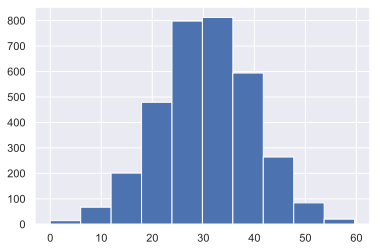

In [6]:
df['Total day charge'].hist()

In [7]:
features=['Total day charge','Total night charge']

array([[<AxesSubplot:title={'center':'Total day charge'}>,
        <AxesSubplot:title={'center':'Total night charge'}>]],
      dtype=object)

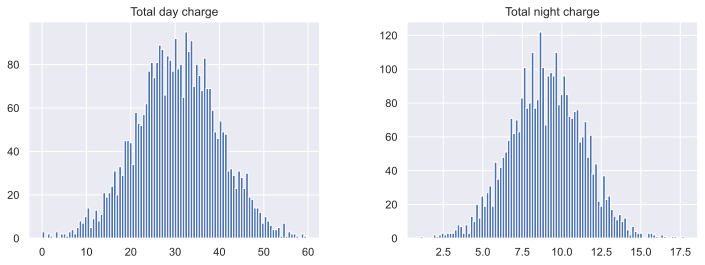

In [11]:
df[features].hist(figsize=(12,4), bins=100)

<AxesSubplot:ylabel='Density'>

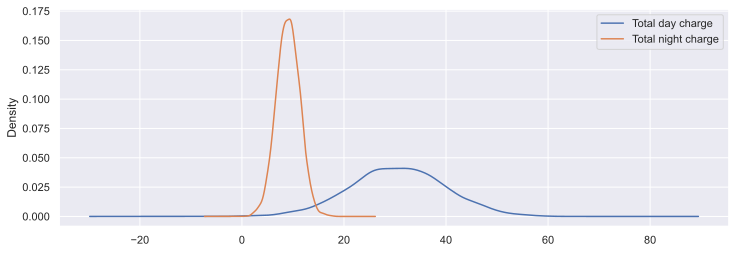

In [10]:
df[features].plot(kind='density',figsize=(12,4))

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>]],
      dtype=object)

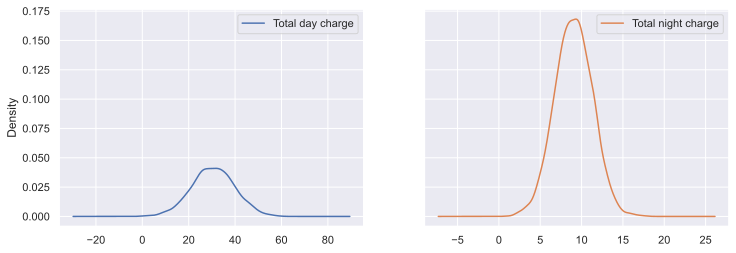

In [17]:
df[features].plot(kind='density',figsize=(12,4), subplots=True, layout=(1,2), sharey=True, sharex=False)

<AxesSubplot:xlabel='Total eve charge'>

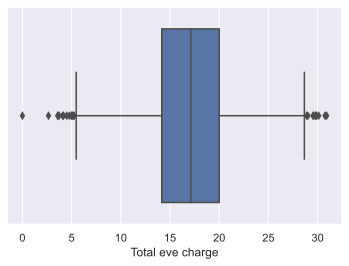

In [18]:
sns.boxplot(df['Total eve charge'])

<AxesSubplot:xlabel='Total eve charge'>

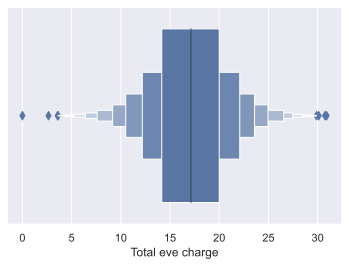

In [22]:
sns.boxenplot(df['Total eve charge'])

<AxesSubplot:xlabel='Total eve charge'>

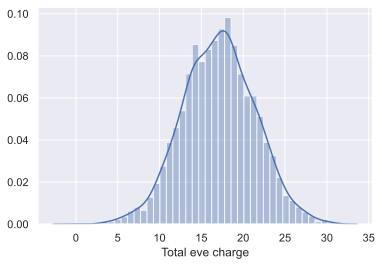

In [20]:
sns.distplot(df['Total eve charge'])

<AxesSubplot:xlabel='Total eve charge'>

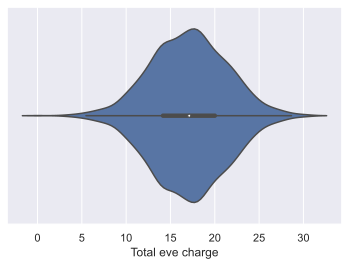

In [21]:
sns.violinplot(df['Total eve charge'])

<AxesSubplot:>

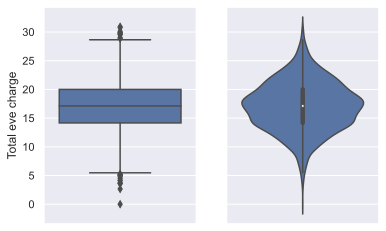

In [23]:
_, axes=plt.subplots(1,2, sharey=True, figsize=(6,4))
sns.boxplot(y=df['Total eve charge'], ax=axes[0])
sns.violinplot(y=df['Total eve charge'].values, ax=axes[1])

<AxesSubplot:>

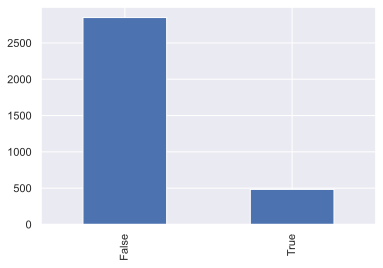

In [24]:
df.Churn.value_counts().plot.bar()

<AxesSubplot:>

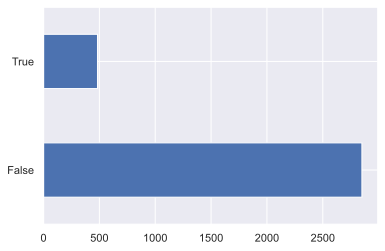

In [26]:
df.Churn.value_counts().plot.barh()

<AxesSubplot:>

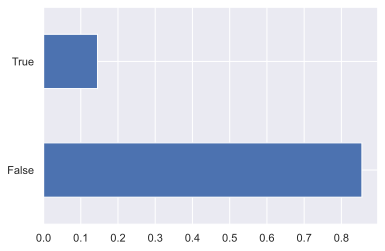

In [27]:
df.Churn.value_counts(normalize=True).plot.barh()

<AxesSubplot:xlabel='Churn', ylabel='count'>

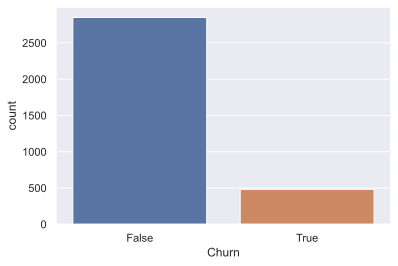

In [29]:
sns.countplot(df.Churn)

In [ ]:
features=['Churn','Customer service calls']

<AxesSubplot:ylabel='count'>

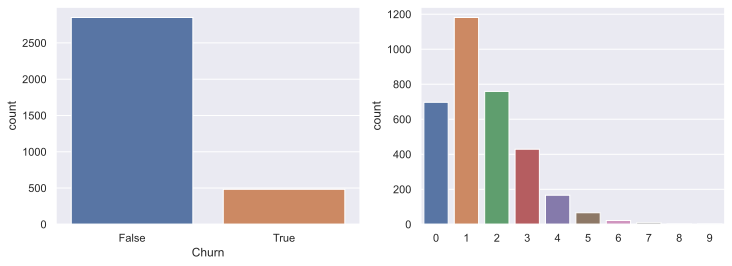

In [32]:
_, axes=plt.subplots(1,2, sharey=False, figsize=(12,4))
sns.countplot(df.Churn, ax=axes[0])
sns.countplot(df['Customer service calls'].values, ax=axes[1])

# Multivariate Viz

<AxesSubplot:>

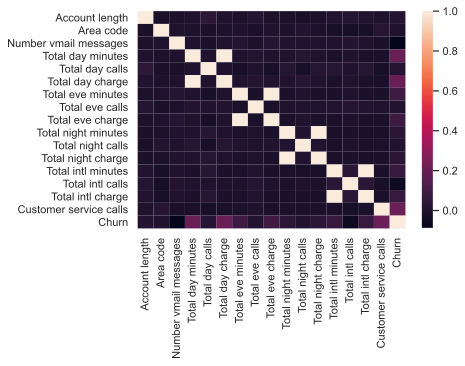

In [33]:
sns.heatmap(df.corr())

<AxesSubplot:>

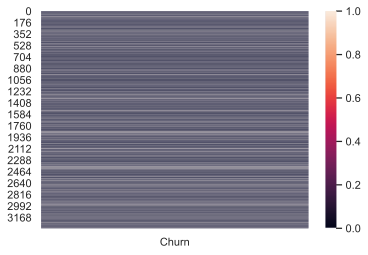

In [38]:
sns.heatmap(df[['Churn']])

In [41]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)

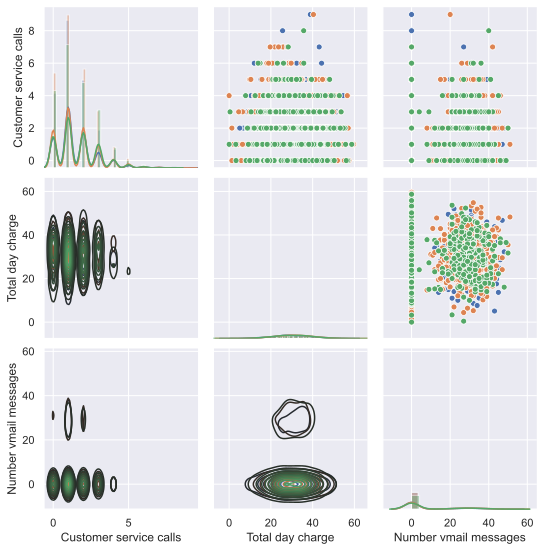

In [43]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.distplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)

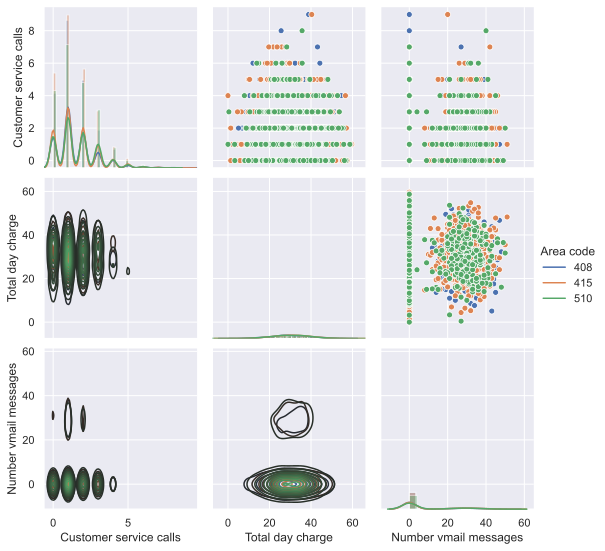

In [44]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.distplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.add_legend()

<AxesSubplot:xlabel='Total day calls', ylabel='Customer service calls'>

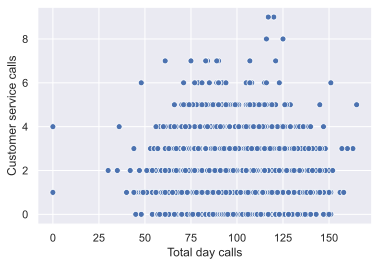

In [47]:
sns.scatterplot(df['Total day calls'],df['Customer service calls'])

<AxesSubplot:xlabel='Total day minutes', ylabel='Total day charge'>

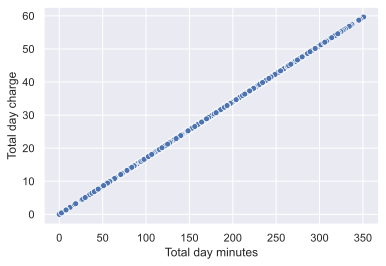

In [48]:
sns.scatterplot(df['Total day minutes'],df['Total day charge'])

<AxesSubplot:xlabel='Total day minutes'>

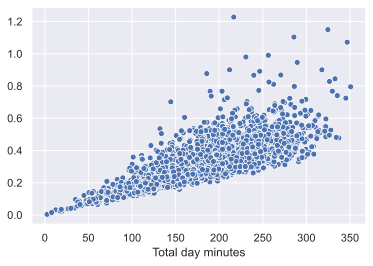

In [49]:
sns.scatterplot(df['Total day minutes'],df['Total day charge']/df['Total day calls'])

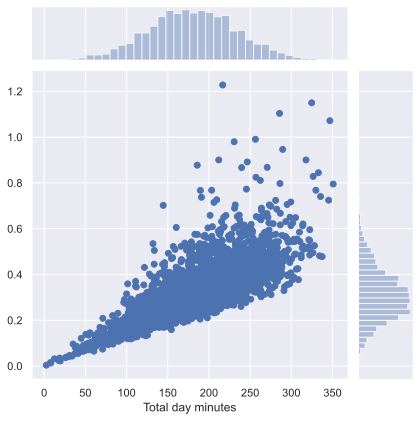

In [51]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'])

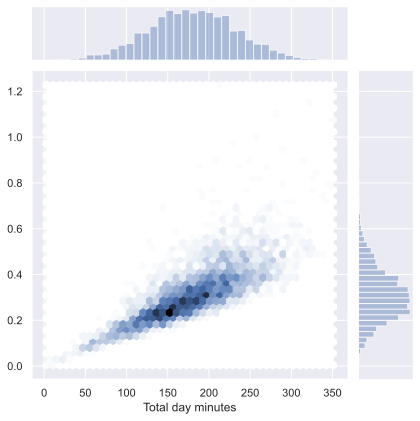

In [52]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'], kind='hex')

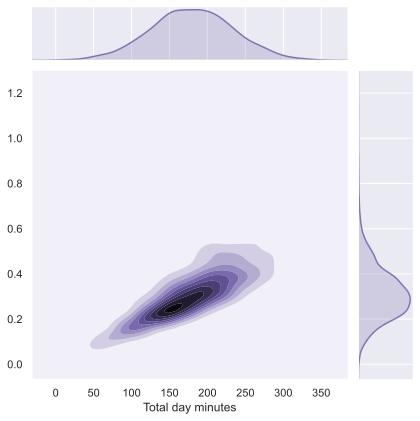

In [55]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'], kind='kde', color='m')

<AxesSubplot:xlabel='Churn', ylabel='Total intl calls'>

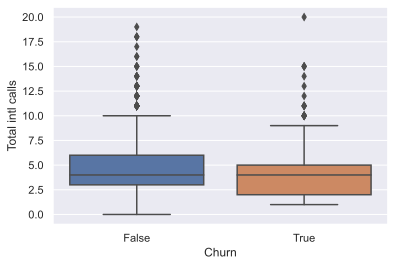

In [57]:
sns.boxplot('Churn','Total intl calls', data=df)

<AxesSubplot:xlabel='Churn', ylabel='Total intl calls'>

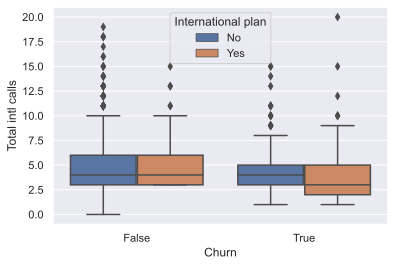

In [58]:
sns.boxplot(x='Churn',y='Total intl calls', data=df, hue='International plan')

<AxesSubplot:xlabel='Churn', ylabel='Total intl charge'>

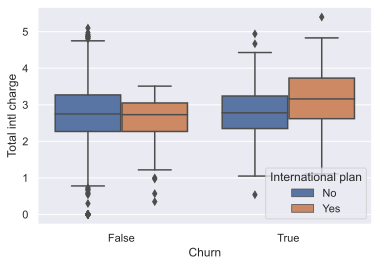

In [59]:
sns.boxplot(x='Churn',y='Total intl charge', data=df, hue='International plan')

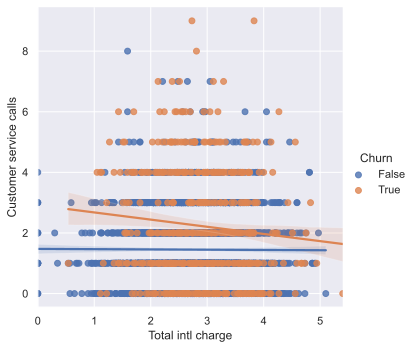

In [62]:
sns.lmplot(data=df, x='Total intl charge', y='Customer service calls', hue='Churn')

In [66]:
num_features=df._get_numeric_data().columns.drop('Area Code')
num_features

KeyError: "['Area Code'] not found in axis"

IndexError: index 5 is out of bounds for axis 0 with size 5

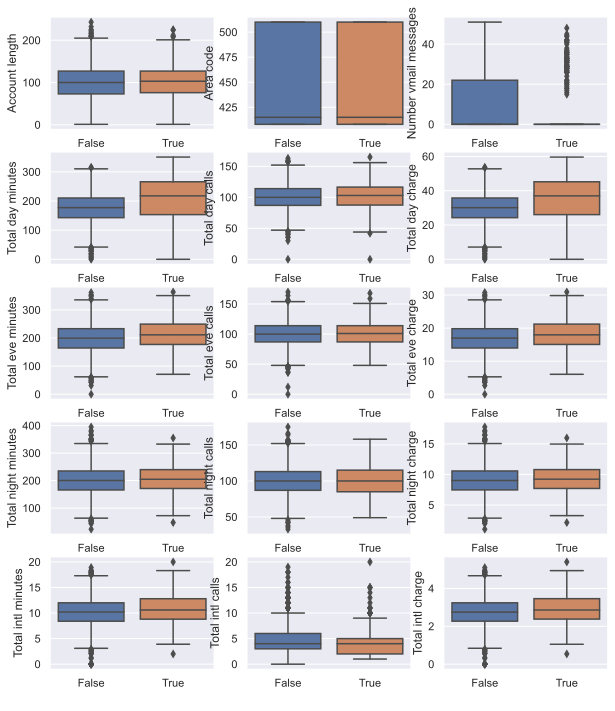

In [67]:
fig, axes=plt.subplots(5,3, figsize=(10,12))
for idx, feature in enumerate(num_features):
    ax=axes[idx//3,idx%3]
    sns.boxplot(x='Churn', y=feature, data=df, ax=ax)
    ax.set_xlabel(' ')
    ax.set_ylabel(feature)
fig.tight_layout();

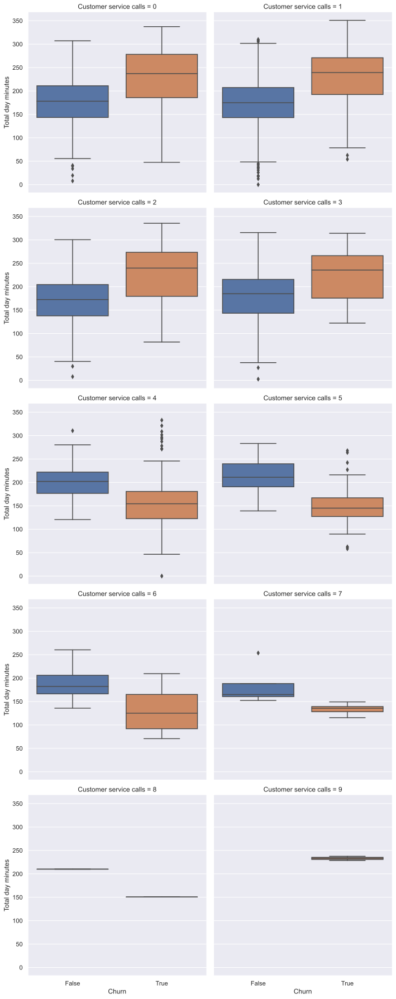

In [70]:
sns.factorplot(data=df, x='Churn', kind='box', y='Total day minutes', col='Customer service calls', col_wrap=2, size=5)

<AxesSubplot:xlabel='Customer service calls', ylabel='Total intl charge'>

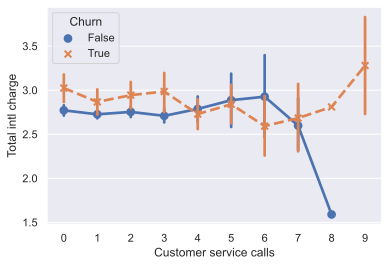

In [71]:
sns.pointplot(x='Customer service calls', y='Total intl charge', hue='Churn', data=df, markers=['o','x'], linestyles=['-','--'])